In [1]:
# helper function
def convert_binary_to_grayscale(bin_image):
    return (bin_image*255)

# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob
%matplotlib inline

def find_points_for_calibration():
    images = glob.glob('camera_cal/calibration*.jpg')
    # arrays to store object points (original object) and image points (distorted image)
    objpoints = [] # 3D point in real world space
    imgpoints = [] # 2D point in image plane

    # Prepare object point like (0,0,0), (1,0,0), (2,0,0), .... (6,4,0)
    objp = np.zeros((6*9, 3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x, y coordinates


    for fname in images:
        img = mpimg.imread(fname)
        # Convert image to grayscale
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

    return (objpoints, imgpoints)

def calibrate_camera():
    objpoints, imgpoints = find_points_for_calibration()
    img = mpimg.imread('camera_cal/calibration4.jpg')
    img = np.copy(img)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[1::-1], None, None)
    with open('mtx.dist.p', 'wb') as handle:
        pickle.dump({ "mtx": mtx, "dist": dist }, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    return (ret, mtx, dist, rvecs, tvecs)

# Distortion Correction Example

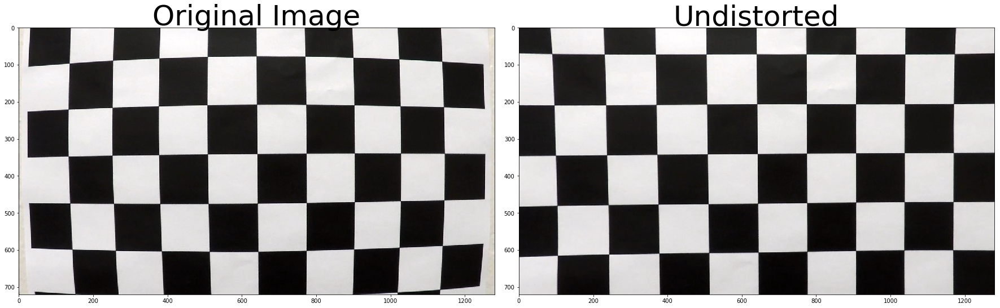

In [3]:
ret, mtx, dist, rvecs, tvecs = calibrate_camera()

img = mpimg.imread('camera_cal/calibration1.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)

cv2.imwrite("output_images/undistorted_chessboard.jpg", dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

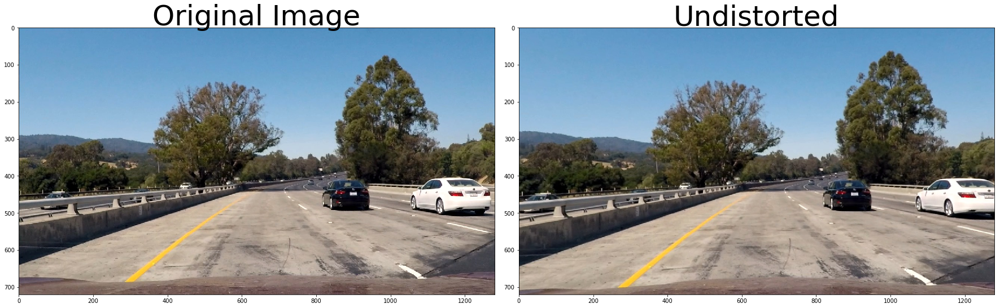

In [4]:
ret, mtx, dist, rvecs, tvecs = calibrate_camera()

img = mpimg.imread('test_images/test1.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)

bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/undistorted_test_image.jpg", bgr)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Color transforms, gradients, and magnitudes to create a thresholded binary image.

In [5]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(20, 100)):
    img = np.copy(img)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    img = np.copy(img)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=3, thresh=(0.7, 1.3)):
    img = np.copy(img)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def color_thresh_s(img, thresh=(220, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
        
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return s_binary

def color_thresh_l(img, thresh=(220, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
        
    # Threshold color channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= thresh[0]) & (l_channel <= thresh[1])] = 1
    
    return l_binary

## Absolute Sobel Threshold example X

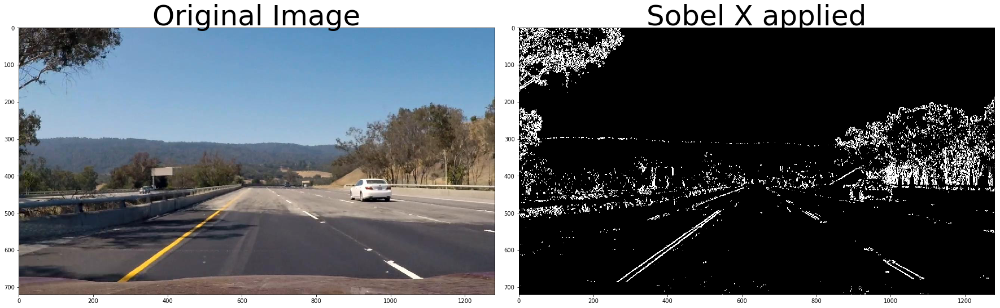

In [6]:
image = mpimg.imread('output_images/test_lane_image.jpg')
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 150))

cv2.imwrite("output_images/threshold_x.jpg", convert_binary_to_grayscale(gradx))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Sobel X applied', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Absolute Sobel Threshold example Y

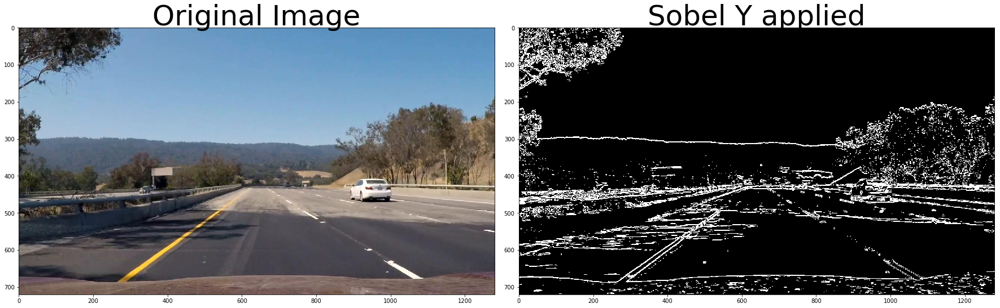

In [7]:
image = mpimg.imread('output_images/test_lane_image.jpg')
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=15, thresh=(20, 150))

cv2.imwrite("output_images/threshold_y.jpg", convert_binary_to_grayscale(grady))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grady, cmap='gray')
ax2.set_title('Sobel Y applied', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Absolute Sobel X and Y combined

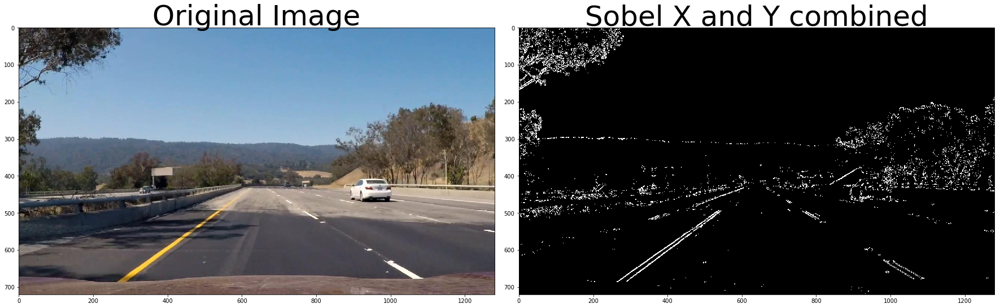

In [8]:
abs_combined = np.zeros_like(gradx)
abs_combined[((gradx == 1) & (grady == 1))] = 1

cv2.imwrite("output_images/threshold_x_y_combined.jpg", convert_binary_to_grayscale(abs_combined))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(abs_combined, cmap='gray')
ax2.set_title('Sobel X and Y combined', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Magnitude Gradient Example

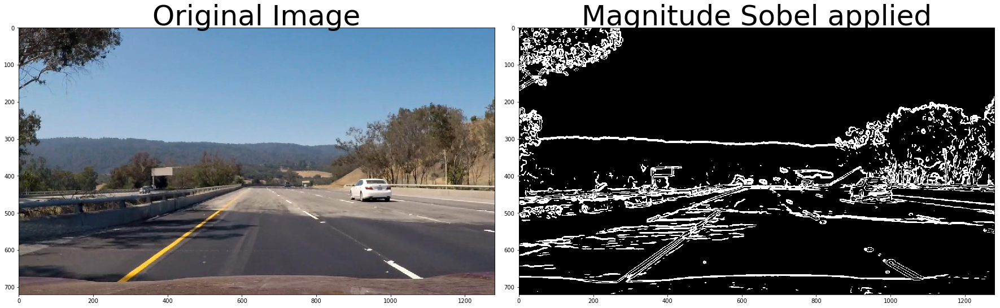

In [9]:
image = mpimg.imread('output_images/test_lane_image.jpg')
mag = mag_thresh(image, sobel_kernel=15, mag_thresh=(30, 100))

cv2.imwrite("output_images/threshold_mag.jpg", convert_binary_to_grayscale(mag))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag, cmap='gray')
ax2.set_title('Magnitude Sobel applied', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Direction Gradient Example

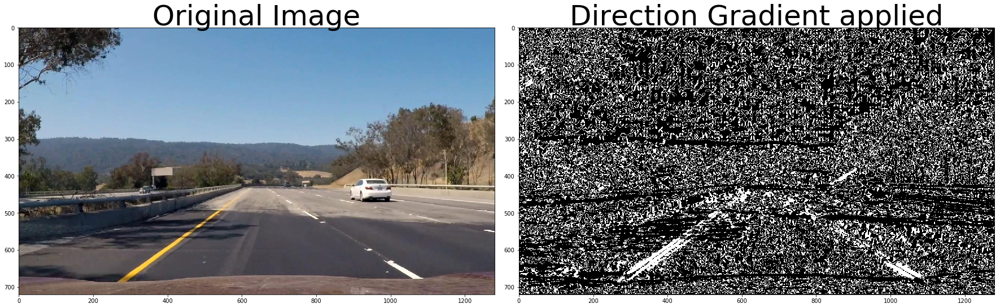

In [10]:
image = mpimg.imread('output_images/test_lane_image.jpg')
dir = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.2))

cv2.imwrite("output_images/threshold_dir.jpg", convert_binary_to_grayscale(dir))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir, cmap='gray')
ax2.set_title('Direction Gradient applied', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Combined Thresholds Example

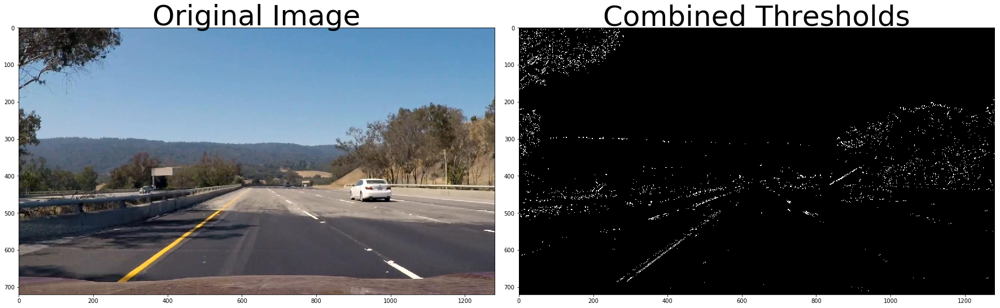

In [11]:
image = mpimg.imread('output_images/test_lane_image.jpg')

gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=15, thresh=(20, 150))
mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(15, 100))
dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1
    
cv2.imwrite("output_images/threshold_combined.jpg", convert_binary_to_grayscale(combined))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Thresholds', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Color Threshold S Example

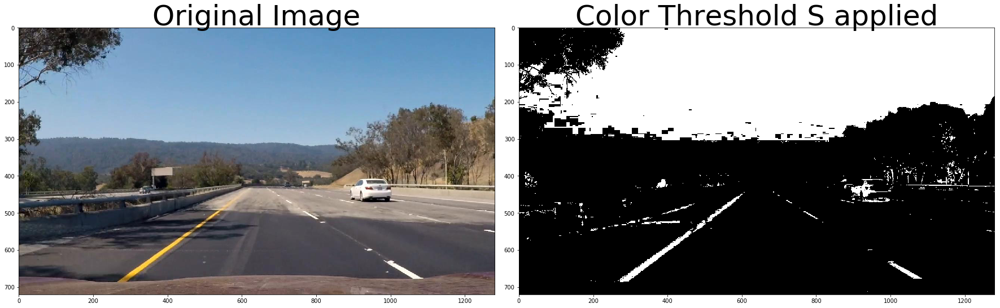

In [12]:
image = mpimg.imread('output_images/test_lane_image.jpg')
color_s = color_thresh_s(image, thresh=(100, 255))

cv2.imwrite("output_images/threshold_color_s.jpg", convert_binary_to_grayscale(color_s))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(color_s, cmap='gray')
ax2.set_title('Color Threshold S applied', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Color Threshold L Example

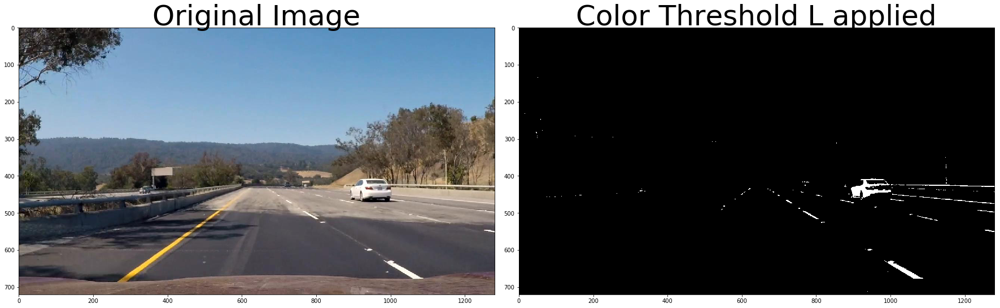

In [13]:
image = mpimg.imread('output_images/test_lane_image.jpg')
color_l = color_thresh_l(image, thresh=(200, 255))

cv2.imwrite("output_images/threshold_color_l.jpg", convert_binary_to_grayscale(color_l))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(color_l, cmap='gray')
ax2.set_title('Color Threshold L applied', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Color Thresholds Combined Example

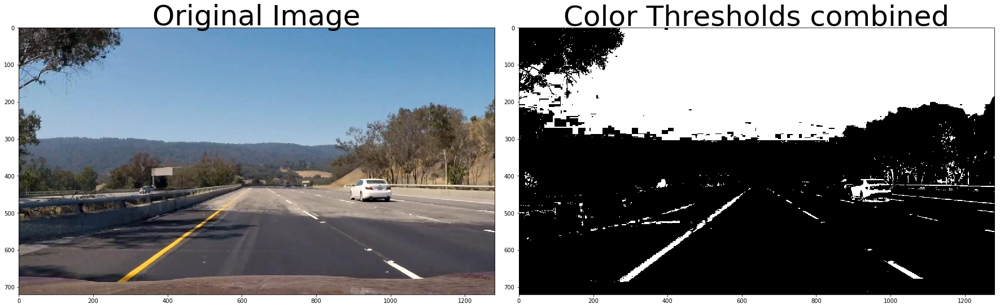

In [14]:
color_combined = np.zeros_like(dir_binary)
color_combined[(color_s == 1) | (color_l == 1)] = 1

cv2.imwrite("output_images/threshold_color_combined.jpg", convert_binary_to_grayscale(color_combined))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(color_combined, cmap='gray')
ax2.set_title('Color Thresholds combined', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## All thresholds Combined Example

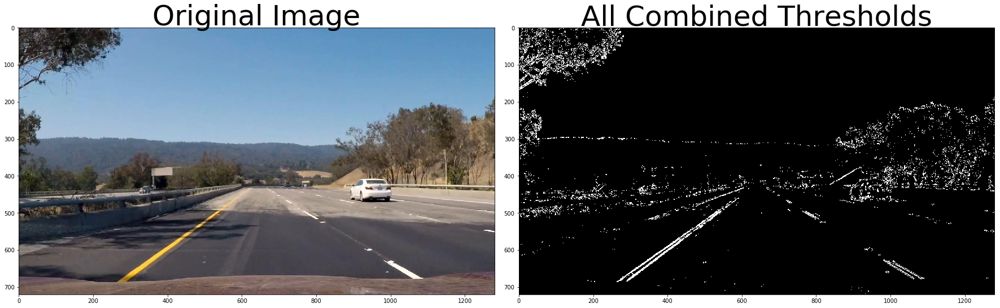

In [15]:
image = mpimg.imread('output_images/test_lane_image.jpg')

gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=15, thresh=(20, 150))
mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(15, 100))
dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3))
color_s = color_thresh_s(image, thresh=(100, 255))
color_l = color_thresh_l(image, thresh=(220, 255))

all_combined = np.zeros_like(dir_binary)
all_combined[((gradx == 1) & (grady == 1)) | ((color_s == 1) | (color_l == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1
all_combined[((gradx == 1) & (grady == 1)) | ((color_s == 1) | (color_l == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1

cv2.imwrite("output_images/threshold_all_combined.jpg", convert_binary_to_grayscale(all_combined))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(all_combined, cmap='gray')
ax2.set_title('All Combined Thresholds', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Perspective Transform

In [16]:
def get_transform_matrix():
    img = mpimg.imread('test_images/straight_lines1.jpg')
    h,w= img.shape[:2]
    
    src = np.float32(
        [[685, 450], 
          [1090, 710], 
          [220, 710], 
          [595, 450]])
    
    dst = np.float32(
        [[900, 0], 
          [900, 710], 
          [250, 710], 
          [250, 0]])

    M = cv2.getPerspectiveTransform(src, dst)
    
    return M

def get_inverse_transform_matrix():
    img = mpimg.imread('test_images/straight_lines1.jpg')
    h,w= img.shape[:2]
    
    src = np.float32(
        [[685, 450], 
          [1090, 710], 
          [220, 710], 
          [595, 450]])
    
    dst = np.float32(
        [[900, 0], 
          [900, 710], 
          [250, 710], 
          [250, 0]])

    M = cv2.getPerspectiveTransform(dst, src)
    
    return M

# takes an image and warps the perspective
def warp_perspective(img, M):
    img = np.copy(img)
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size)
    
    return warped

# Remove a region of an image
def remove_region(img, triangle):
    mask = np.ones_like(img) 
    mask = cv2.fillPoly(mask, [triangle], 0)

    new_combined = np.zeros_like(img)
    new_combined[((img == 1) & (mask == 1))] = 1
    
    return new_combined

## Perspective Tranform Example

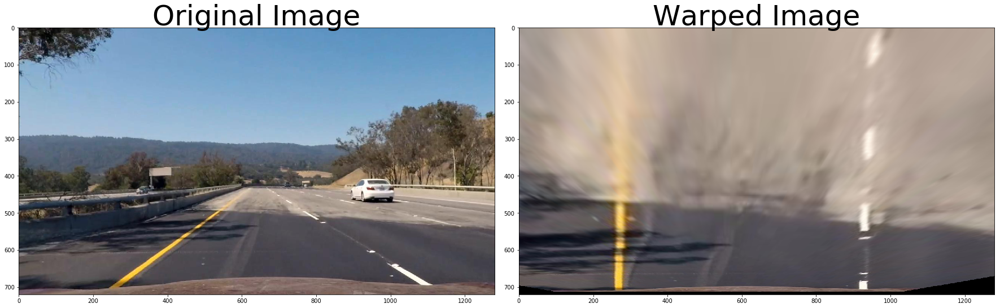

In [17]:
image = mpimg.imread('output_images/test_lane_image.jpg')

ret, mtx, dist, rvecs, tvecs = calibrate_camera()
image = cv2.undistort(image, mtx, dist, None, mtx)
M = get_transform_matrix()

warped = warp_perspective(image, M)

bgr = cv2.cvtColor(warped, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/warped.jpg", bgr)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Detect lane pixels and fit to find the lane boundary

### Combine Thresholds and Warpe Image

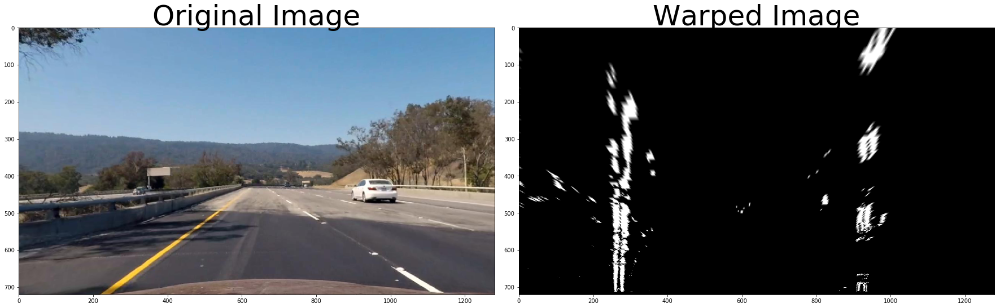

In [18]:
image = mpimg.imread('output_images/test_lane_image.jpg')

ret, mtx, dist, rvecs, tvecs = calibrate_camera()
image = cv2.undistort(image, mtx, dist, None, mtx)
M = get_transform_matrix()

image = cv2.undistort(image, mtx, dist, None, mtx)
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=15, thresh=(20, 150))
mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(15, 100))
dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3))
color_s = color_thresh_s(image, thresh=(100, 255))
color_l = color_thresh_l(image, thresh=(220, 255))

all_combined = np.zeros_like(dir_binary)
all_combined[((gradx == 1) & (grady == 1)) | ((color_s == 1) | (color_l == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1

# Remove a piece of the road between te lanes. This removes some noise that may be in between the lane lines
h,w= all_combined.shape[:2]
triangle = np.array([[350, h], [w-300, h], [w//2, 500]], np.int32)
all_combined = remove_region(all_combined, triangle)

warped = warp_perspective(all_combined, M)

cv2.imwrite("output_images/threshold_and_warped.jpg", convert_binary_to_grayscale(warped))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Detect lane lines with histogram

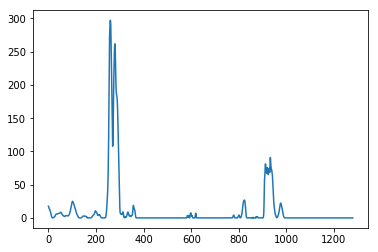

In [19]:
histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)

plt.plot(histogram)
plt.savefig('output_images/histogram.png')

### Fit Polynomial

In [20]:
def fit_polynomial(binary_warped):
    binary_warped = np.copy(binary_warped)
    binary_warped = np.uint8(binary_warped) 
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return (left_fit, right_fit, left_fitx, right_fitx, ploty, out_img)

def fit_polynomial_without_sliding(binary_warped, left_fit, right_fit):
    binary_warped = np.copy(binary_warped)
    #binary_warped = np.uint8(binary_warped)
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 50
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return left_fit, right_fit, left_fitx, right_fitx, ploty, []

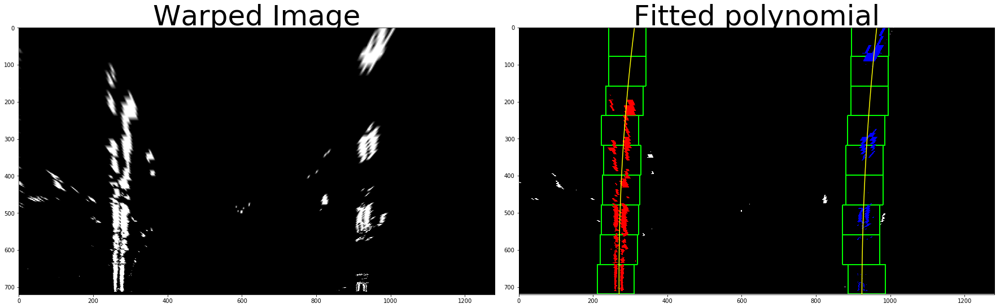

In [21]:
left_fit, right_fit, left_fitx, right_fitx, ploty, out_img = fit_polynomial(warped)

cv2.imwrite("output_images/polynomial.jpg", out_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(warped, cmap='gray')
ax1.set_title('Warped Image', fontsize=50)
ax2.imshow(out_img)
ax2.set_title('Fitted polynomial', fontsize=50)
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Draw lane

In [22]:
def draw_lines(binary_warped, undist, left_fit, right_fit, Minv):
    binary_warped = np.copy(binary_warped)
    undist = np.copy(undist)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    #Minv = inv(M)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

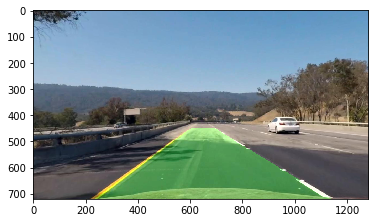

In [23]:
Minv = get_inverse_transform_matrix()

result = draw_lines(warped, image, left_fit, right_fit, Minv)

bgr = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/lines_drawn.jpg", bgr)
plt.imshow(result)

# Determine the curvature of the lane and vehicle position with respect to center

In [24]:
# calculates the radius of curvature in meters
def calculate_radius_of_curvature(leftx, rightx):
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    return left_curverad, right_curverad

def calculate_offset_from_lane_center(img, left_fitx, right_fitx):
    xm_per_pix = 3.7/700
    car_current_position = img.shape[1]/2
    left_line_position = left_fitx[::-1][0]
    right_line_position = right_fitx[::-1][0]
    lane_center_position = (left_line_position + right_line_position) / 2
    offset = abs((car_current_position - lane_center_position) * xm_per_pix)
    
    return offset

def draw_radius_of_curvature(img, left_curverad, right_curverad):
    img = np.copy(img)
    font = cv2.FONT_HERSHEY_SIMPLEX
    text =  "Radius of Curvature {} m".format(int((left_curverad + right_curverad)/2))
    cv2.putText(img,text,(120,140), font, 2,(255,255,255),2,cv2.LINE_AA)
    
    return img

def draw_car_offset(img, offset):
    img = np.copy(img)
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Distance from center %.2f m" % offset
    cv2.putText(img,text,(120,80), font, 2,(255,255,255),2,cv2.LINE_AA)
    
    return img

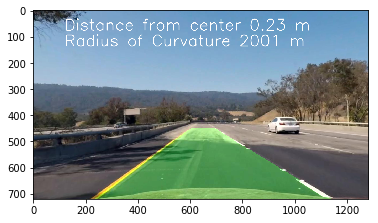

In [25]:
left_curverad, right_curverad = calculate_radius_of_curvature(left_fitx, right_fitx)
result = draw_radius_of_curvature(result, left_curverad, right_curverad)

offset = calculate_offset_from_lane_center(warped, left_fitx, right_fitx)
result = draw_car_offset(result, offset)

bgr = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/curvature_and_offset_drawn.jpg", bgr)

plt.imshow(result)

# Test Image

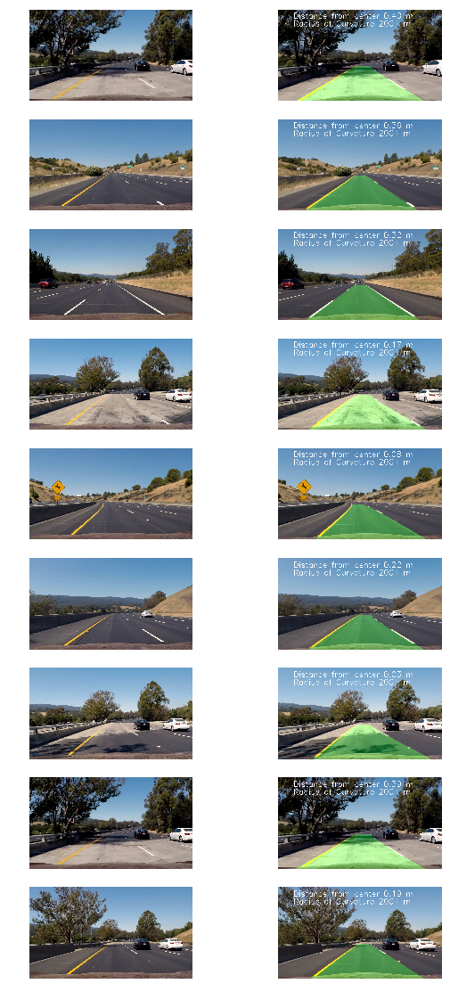

In [26]:
def process_test_image(image):
    image = np.copy(image)
    image = cv2.undistort(image, mtx, dist, None, mtx)
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 150))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=15, thresh=(20, 150))
    mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(15, 100))
    dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3))
    color_s = color_thresh_s(image, thresh=(100, 255))
    color_l = color_thresh_l(image, thresh=(220, 255))

    all_combined = np.zeros_like(dir_binary)
    all_combined[((gradx == 1) & (grady == 1)) | ((color_s == 1) | (color_l == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1

    h,w= all_combined.shape[:2]

    triangle = np.array([[400, h], [w-400, h], [w//2, 500]], np.int32)
    all_combined = remove_region(all_combined, triangle)
    warped = warp_perspective(all_combined, M)
    
    left_fit, right_fit, left_fitx, right_fitx, ploty, out_img = fit_polynomial(warped)
    result = draw_lines(warped, image, left_fit, right_fit, Minv)
    result = draw_radius_of_curvature(result, left_curverad, right_curverad)
    offset = calculate_offset_from_lane_center(warped, left_fitx, right_fitx)
    result = draw_car_offset(result, offset)
    
    return result

# Make a list of example images
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    img = mpimg.imread(image)
    bin_img = process_test_image(img)
    bgr = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
    cv2.imwrite("output_images/test%s.jpg" % (i), bgr)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(bin_img)
    axs[i].axis('off')
    i += 1

# Pipeline

In [27]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.mean(np.array(self.recent_xfitted), axis=0)  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def add_coefficients(self, fit, radius):      
        if (self.radius_of_curvature and np.absolute(radius - self.radius_of_curvature) > 500):
            return 
        
        if (len(self.recent_xfitted) >= 10):
            self.recent_xfitted.pop(0)
             
        self.detected = True
        self.current_fit = fit
        self.recent_xfitted.append(fit)
        
class Lane():
    def __init__(self):
        self.left_line = Line()
        self.right_line = Line()
        self.distance_from_center = 0
        
    def fit_polynomial(self, warped):
        # Do not using sliding window if line is already detected
        if (self.left_line.detected and self.right_line.detected):
            left_fit, right_fit, left_fitx, right_fitx, ploty, out_img = fit_polynomial_without_sliding(warped, self.left_line.current_fit, self.right_line.current_fit)
        else:
            left_fit, right_fit, left_fitx, right_fitx, ploty, out_img = fit_polynomial(warped)
            
        
        left_radius, right_radius = calculate_radius_of_curvature(left_fitx, right_fitx)
        self.left_line.radius_of_curvature = left_radius
        self.right_line.radius_of_curvature = right_radius
        self.distance_from_center = calculate_offset_from_lane_center(warped, left_fitx, right_fitx)
        self.left_line.add_coefficients(left_fit, left_radius)
        self.right_line.add_coefficients(right_fit, right_radius)
        
        left_line = np.mean(np.array(self.left_line.recent_xfitted), axis=0)
        right_line = np.mean(np.array(self.right_line.recent_xfitted), axis=0)

        return left_line, right_line


In [28]:
ret, mtx, dist, rvecs, tvecs = calibrate_camera()
M = get_transform_matrix()
Minv = get_inverse_transform_matrix()
lane = Lane()

def process_image(image):
    image = np.copy(image)
    image = cv2.undistort(image, mtx, dist, None, mtx)
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(20, 150))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=15, thresh=(20, 150))
    mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(15, 100))
    dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3))
    color_s = color_thresh_s(image, thresh=(100, 255))
    color_l = color_thresh_l(image, thresh=(220, 255))

    all_combined = np.zeros_like(dir_binary)
    all_combined[((gradx == 1) & (grady == 1)) | ((color_s == 1) | (color_l == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1

    h,w= all_combined.shape[:2]
    triangle = np.array([[400, h], [w-400, h], [w//2, 500]], np.int32)
    all_combined = remove_region(all_combined, triangle)
    warped = warp_perspective(all_combined, M)
    
    #left_fit, right_fit = lane.fit_polynomial(warped)
    left_line, right_line = lane.fit_polynomial(warped)
    result = draw_lines(warped, image, left_line, right_line, Minv)
    
    #left_curverad, right_curverad = calculate_radius_of_curvature(left_fitx, right_fitx)
    result = draw_radius_of_curvature(result, lane.left_line.radius_of_curvature, lane.right_line.radius_of_curvature)
    result = draw_car_offset(result, lane.distance_from_center)
    
    return result

/home/bartdezwaan/anaconda2/envs/mlbook/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/home/bartdezwaan/anaconda2/envs/mlbook/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [29]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output_video = 'output_project_video.mp4'
input_video = 'project_video.mp4'
clip1 = VideoFileClip(input_video)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


100%|█████████▉| 1260/1261 [08:04<00:00,  2.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 

CPU times: user 14min 16s, sys: 17.5 s, total: 14min 34s
Wall time: 8min 5s


In [30]:
output_video = 'output_project_video.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))